# Import Liabiries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 300
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("Cardiotocographic.csv")
df

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.000000,2.4,64.0,0.999926,2.000000
1,132.000000,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.000000
2,133.000000,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.000000
3,134.000000,0.002561,0.000000,0.007742,0.002561,0.0,0.0,16.0,2.4,0.000000,23.0,117.0,1.000000,1.000000
4,131.948232,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.000000,0.000000,0.961268,0.007426,0.000000,0.0,0.0,79.0,0.2,25.000000,7.2,40.0,0.000000,2.000000
2122,140.000000,0.000775,0.000000,0.006979,0.000000,0.0,0.0,78.0,0.4,22.000000,7.1,66.0,1.000000,2.000000
2123,140.000000,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.000000,6.1,67.0,1.000000,1.990464
2124,140.000000,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.000000,7.0,66.0,1.000000,2.000000


# EDA (Exploratory Data Analysis)

- Exploratory Data Analysis (EDA) is an approach to analyze the data using visual techniques and statistical techniques. It is used to discover trends, patterns, or to check assumptions with the help of statistical summary and graphical representations.

**Steps involved in EDA**
1. Describing the data
2. Data cleaning
3. Imputation techniques
4. Data analysis and visualization
5. Transformations
6. Auto EDA

# Describing the data

In [3]:
df.describe()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2105.000000,2106.000000,2126.000000,2126.000000,2126.000000,2105.000000,2105.000000,2126.000000,2126.000000,2126.000000,2105.000000,2105.000000,2105.000000,2105.000000
mean,133.343598,0.003219,0.009894,0.004391,0.001895,0.000003,0.000175,46.995984,1.364378,10.285964,8.284887,70.429260,0.316371,1.304507
std,11.270154,0.004391,0.067540,0.003340,0.003343,0.000142,0.000840,18.813973,1.173632,21.205041,7.772858,42.931822,0.645622,0.644619
min,51.842487,-0.019284,-0.480634,-0.014925,-0.015393,-0.001353,-0.005348,-63.000000,-6.600000,-91.000000,-50.700000,-174.000000,-3.000000,-1.025988
25%,126.000000,0.000000,0.000000,0.001851,0.000000,0.000000,0.000000,32.000000,0.700000,0.000000,4.600000,37.000000,0.000000,1.000000
50%,133.000000,0.001634,0.000000,0.004484,0.000000,0.000000,0.000000,49.000000,1.200000,0.000000,7.400000,67.000000,0.000000,1.000000
75%,140.000000,0.005650,0.002567,0.006536,0.003289,0.000000,0.000000,61.000000,1.700000,11.000000,10.900000,100.000000,1.000000,1.000000
max,214.000000,0.038567,0.961268,0.030002,0.030769,0.002706,0.010695,162.000000,13.800000,182.000000,101.400000,357.000000,3.000000,5.000000


# Looking at the above-described statistics, we can quickly determine which columns contain missing data. At the same time, we can determine whether the outlier are present or not by comparing them to the 75% and maximum values. We can also determine the skewness.

In [4]:
df.dtypes

LB          float64
AC          float64
FM          float64
UC          float64
DL          float64
DS          float64
DP          float64
ASTV        float64
MSTV        float64
ALTV        float64
MLTV        float64
Width       float64
Tendency    float64
NSP         float64
dtype: object

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2105 non-null   float64
 1   AC        2106 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2105 non-null   float64
 6   DP        2105 non-null   float64
 7   ASTV      2126 non-null   float64
 8   MSTV      2126 non-null   float64
 9   ALTV      2126 non-null   float64
 10  MLTV      2105 non-null   float64
 11  Width     2105 non-null   float64
 12  Tendency  2105 non-null   float64
 13  NSP       2105 non-null   float64
dtypes: float64(14)
memory usage: 232.7 KB


# Duplicates

In [6]:
df

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.000000,2.4,64.0,0.999926,2.000000
1,132.000000,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.000000
2,133.000000,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.000000
3,134.000000,0.002561,0.000000,0.007742,0.002561,0.0,0.0,16.0,2.4,0.000000,23.0,117.0,1.000000,1.000000
4,131.948232,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.000000,0.000000,0.961268,0.007426,0.000000,0.0,0.0,79.0,0.2,25.000000,7.2,40.0,0.000000,2.000000
2122,140.000000,0.000775,0.000000,0.006979,0.000000,0.0,0.0,78.0,0.4,22.000000,7.1,66.0,1.000000,2.000000
2123,140.000000,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.000000,6.1,67.0,1.000000,1.990464
2124,140.000000,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.000000,7.0,66.0,1.000000,2.000000


In [7]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2121    False
2122    False
2123    False
2124    False
2125    False
Length: 2126, dtype: bool

In [8]:
df.duplicated().sum()

2

# Print the duplicated values

In [9]:
df[df.duplicated()]

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
1115,122.0,0.000000,0.0,0.000000,0.0,0.0,0.0,19.0,1.9,0.0,15.1,39.0,0.0,1.0
1458,148.0,0.004717,0.0,0.002358,0.0,0.0,0.0,40.0,0.9,0.0,10.6,35.0,0.0,1.0


In [10]:
df.duplicated(keep = False)

0       False
1       False
2       False
3       False
4       False
        ...  
2121    False
2122    False
2123    False
2124    False
2125    False
Length: 2126, dtype: bool

In [11]:
df[df.duplicated(keep = False)]

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
1113,122.0,0.000000,0.0,0.000000,0.0,0.0,0.0,19.0,1.9,0.0,15.1,39.0,0.0,1.0
1115,122.0,0.000000,0.0,0.000000,0.0,0.0,0.0,19.0,1.9,0.0,15.1,39.0,0.0,1.0
1457,148.0,0.004717,0.0,0.002358,0.0,0.0,0.0,40.0,0.9,0.0,10.6,35.0,0.0,1.0
1458,148.0,0.004717,0.0,0.002358,0.0,0.0,0.0,40.0,0.9,0.0,10.6,35.0,0.0,1.0


# Drop Duplicated records

In [12]:
df.drop_duplicates(inplace=True)

In [13]:
df.shape

(2124, 14)

In [14]:
df.duplicated().sum()

0

# Missing value imputation
- In dataset, missing data, or missing values, occur when no data value is stored for the variable in an observation.
- Missing data are a common occurrence and can have a significant effect on the conclusions that can be drawn from the data.
- If we don't impute or handle null values, we will not be able to create a machine learning model as python does not understand missing values.
- Handling missing values is a crucial step in EDA.
- Missing values can appear for several reasons like:
- Incomplete data entry
- Issues with machines
- Improper handling of data
- And many more.

# Checking null values

In [15]:
df.head()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,73.0,0.5,43.0,2.4,64.0,0.999926,2.0
1,132.000000,0.006380,0.0,0.006380,0.003190,0.0,0.0,17.0,2.1,0.0,10.4,130.0,0.000000,1.0
2,133.000000,0.003322,0.0,0.008306,0.003322,0.0,0.0,16.0,2.1,0.0,13.4,130.0,0.000000,1.0
3,134.000000,0.002561,0.0,0.007742,0.002561,0.0,0.0,16.0,2.4,0.0,23.0,117.0,1.000000,1.0
4,131.948232,0.006515,0.0,0.008143,0.000000,0.0,0.0,16.0,2.4,0.0,19.9,117.0,1.000000,1.0


In [16]:
df.isna()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2122,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2123,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2124,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [17]:
df.isnull().sum()

LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

# Visualizing missing values

<Axes: >

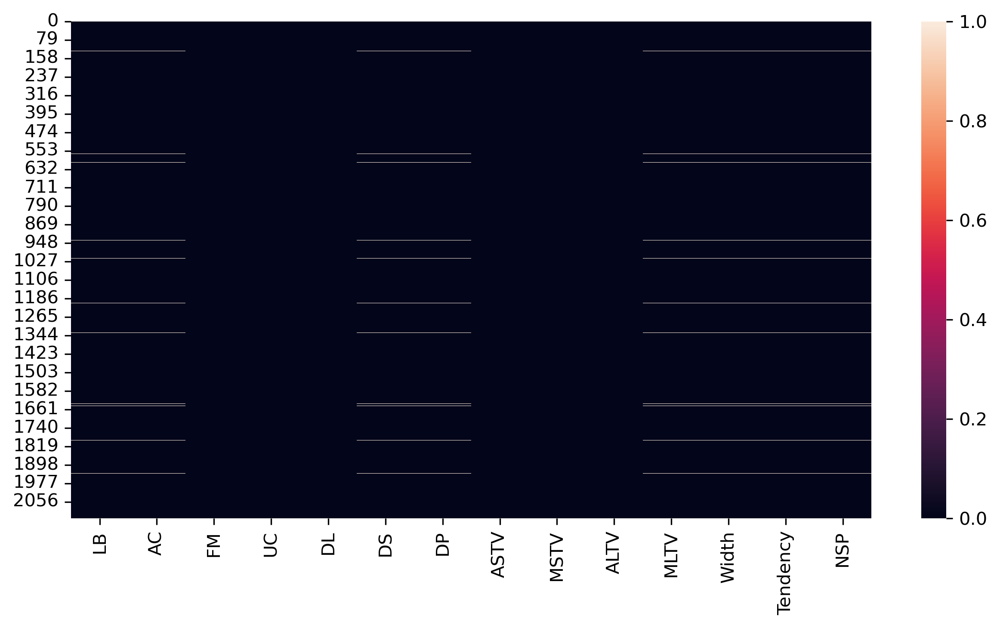

In [18]:
sns.heatmap(df.isnull())

# Calculate the percentage of missig values in each column.

In [19]:
for i in df.isnull().sum():
    print((i/len(df))*100)

0.9887005649717515
0.9416195856873822
0.0
0.0
0.0
0.9887005649717515
0.9887005649717515
0.0
0.0
0.0
0.9887005649717515
0.9887005649717515
0.9887005649717515
0.9887005649717515


# Rule for missing value imputation:
- If NA values are between 1 to 5%, drop na (rows)
- If NA value are 5 to 40%, fillna(replace)
- If NA values are greater than 50% in a column, drop that entire column.

In [20]:
df.head()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,73.0,0.5,43.0,2.4,64.0,0.999926,2.0
1,132.000000,0.006380,0.0,0.006380,0.003190,0.0,0.0,17.0,2.1,0.0,10.4,130.0,0.000000,1.0
2,133.000000,0.003322,0.0,0.008306,0.003322,0.0,0.0,16.0,2.1,0.0,13.4,130.0,0.000000,1.0
3,134.000000,0.002561,0.0,0.007742,0.002561,0.0,0.0,16.0,2.4,0.0,23.0,117.0,1.000000,1.0
4,131.948232,0.006515,0.0,0.008143,0.000000,0.0,0.0,16.0,2.4,0.0,19.9,117.0,1.000000,1.0


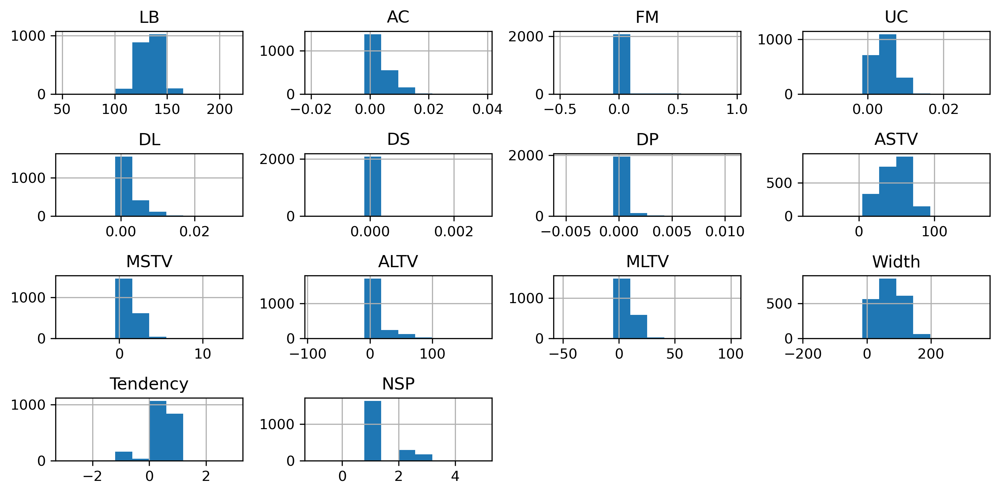

In [21]:
df.hist()
plt.tight_layout()

<Axes: >

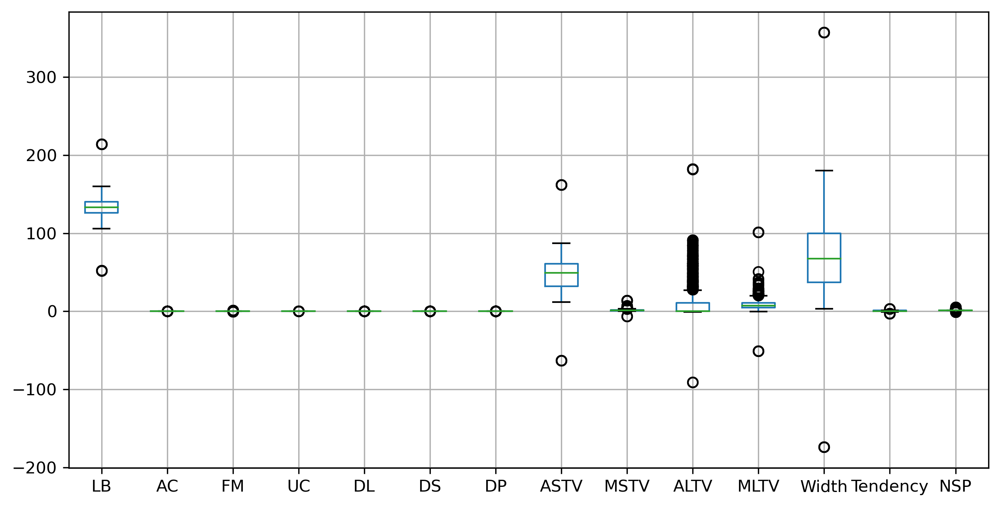

In [22]:
df.boxplot()

In [23]:
LB_Median = df['LB'].median()

In [24]:
LB_Median

133.0

In [25]:
df.isna().sum()

LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

In [26]:
df["LB"].fillna(LB_Median, inplace = True)

In [27]:
df.isnull().sum()

LB           0
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

In [28]:
AC_Median = df["AC"].median()
AC_Median

0.001633991

In [29]:
df["AC"].fillna(AC_Median, inplace = True)

In [30]:
df.isnull().sum()

LB           0
AC           0
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

In [31]:
DS_median = df["DS"].median()
DS_median

0.0

In [32]:
df["DS"].fillna(DS_median, inplace = True)

In [33]:
df.isnull().sum()

LB           0
AC           0
FM           0
UC           0
DL           0
DS           0
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

In [34]:
DP_median = df["DP"].median()
DP_median

0.0

In [35]:
df["DP"].fillna(DP_median, inplace = True)

In [36]:
df.isnull().sum()

LB           0
AC           0
FM           0
UC           0
DL           0
DS           0
DP           0
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

In [37]:
MLTV_median = df["MLTV"].median()
MLTV_median

7.4

In [38]:
df["MLTV"].fillna(MLTV_median, inplace = True)

In [39]:
Width_median = df["Width"].median()
Width_median

67.48646809530248

In [40]:
df["Width"].fillna(Width_median, inplace = True)

In [41]:
Tendency_median = df["Tendency"].median()
Tendency_median

0.0

In [42]:
df["Tendency"].fillna(Tendency_median, inplace = True)

In [43]:
NSP_median = df["NSP"].median()
NSP_median

1.0

In [44]:
df["NSP"].fillna(NSP_median, inplace = True)

In [45]:
df.isnull().sum()

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
Width       0
Tendency    0
NSP         0
dtype: int64

# Now, while looking at the above columns, we have dealt with the missing values using the median. And here's why we chose median: most of the columns consist of outlier, and if we choose mean, the mean will be affected by the outlier, thus median is the best approach to replace missing values. The outliers have never impacted the median.

# Outlier detection

    - There are multiple approaches to detect outliers in the dataset.
        - Histogram
        - Boxplot
        - Descriptive stats for df

In [46]:
df.describe()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.00000,2124.000000,2124.000000,2124.000000
mean,133.338641,0.003205,0.009904,0.004394,0.001897,0.000002,0.000174,47.012459,1.364345,10.295650,8.27184,70.431643,0.313541,1.301783
std,11.212447,0.004374,0.067571,0.003340,0.003344,0.000141,0.000836,18.812403,1.174084,21.212676,7.73691,42.727919,0.643417,0.642369
min,51.842487,-0.019284,-0.480634,-0.014925,-0.015393,-0.001353,-0.005348,-63.000000,-6.600000,-91.000000,-50.70000,-174.000000,-3.000000,-1.025988
25%,126.000000,0.000000,0.000000,0.001858,0.000000,0.000000,0.000000,32.000000,0.700000,0.000000,4.60000,37.000000,0.000000,1.000000
50%,133.000000,0.001634,0.000000,0.004486,0.000000,0.000000,0.000000,49.000000,1.200000,0.000000,7.40000,67.486468,0.000000,1.000000
75%,140.000000,0.005612,0.002568,0.006536,0.003292,0.000000,0.000000,61.000000,1.700000,11.000000,10.80000,100.000000,1.000000,1.000000
max,214.000000,0.038567,0.961268,0.030002,0.030769,0.002706,0.010695,162.000000,13.800000,182.000000,101.40000,357.000000,3.000000,5.000000


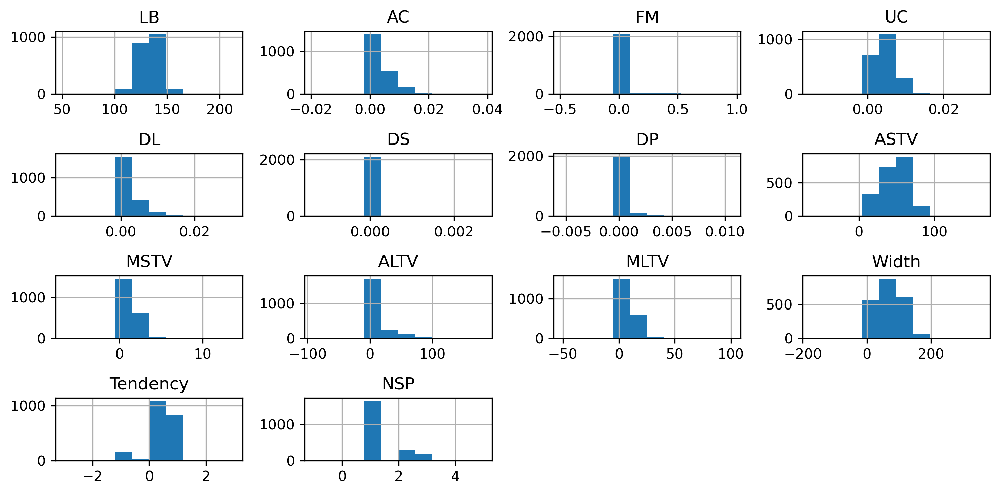

In [47]:
df.hist()
plt.tight_layout()

<Axes: >

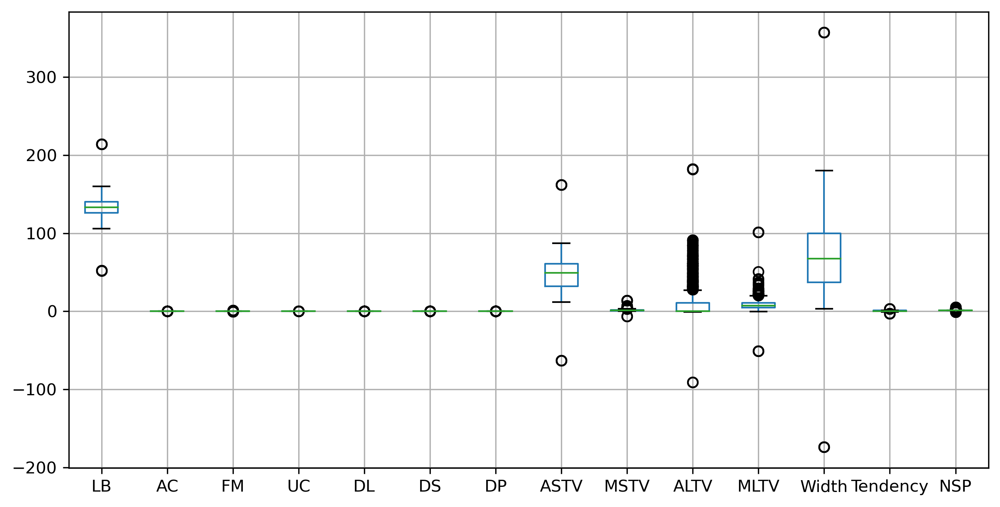

In [48]:
df.boxplot()

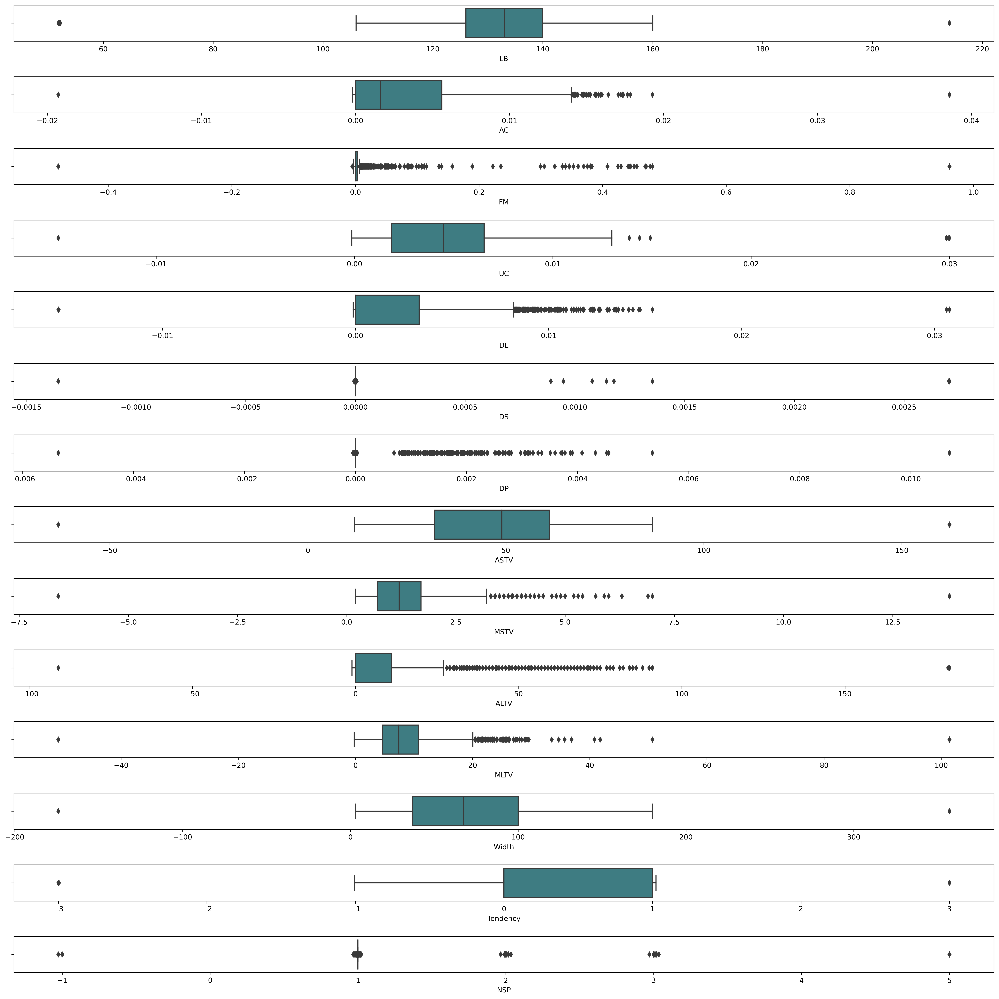

In [49]:
ot=df.copy() 
fig, axes=plt.subplots(14,1,figsize=(20,20),sharex=False,sharey=False)
sns.boxplot(x='LB',data=ot,palette='crest',ax=axes[0])
sns.boxplot(x='AC',data=ot,palette='crest',ax=axes[1])
sns.boxplot(x='FM',data=ot,palette='crest',ax=axes[2])
sns.boxplot(x='UC',data=ot,palette='crest',ax=axes[3])
sns.boxplot(x='DL',data=ot,palette='crest',ax=axes[4])
sns.boxplot(x='DS',data=ot,palette='crest',ax=axes[5])
sns.boxplot(x='DP',data=ot,palette='crest',ax=axes[6])
sns.boxplot(x='ASTV',data=ot,palette='crest',ax=axes[7])
sns.boxplot(x='MSTV',data=ot,palette='crest',ax=axes[8])
sns.boxplot(x='ALTV',data=ot,palette='crest',ax=axes[9])
sns.boxplot(x='MLTV',data=ot,palette='crest',ax=axes[10])
sns.boxplot(x='Width',data=ot,palette='crest',ax=axes[11])
sns.boxplot(x='Tendency',data=ot,palette='crest',ax=axes[12])
sns.boxplot(x='NSP',data=ot,palette='crest',ax=axes[13])
plt.tight_layout(pad=2.0)

# All of the boxplots shown above contain an outlier, thus we must deal with it before establishing the mode.

# Outlier detection function

In [50]:
def outlier_detection(data,colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr = q3-q1
    
    upper = q3+(1.5*iqr)
    lower = q1-(1.5*iqr)
    
    return lower,upper

In [51]:
outlier_detection (df, "LB")

(105.0, 161.0)

# Capping Outliers

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

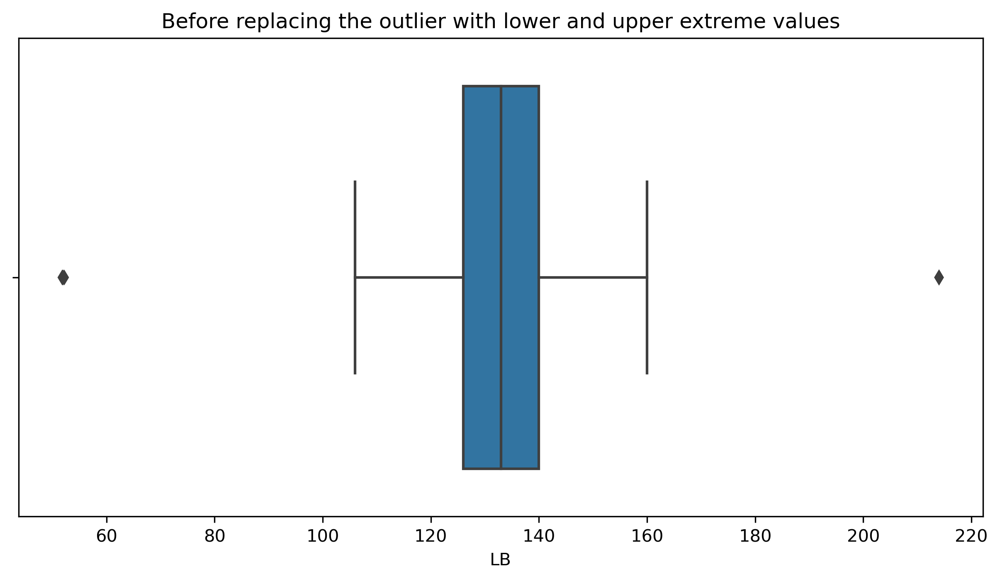

In [52]:
sns.boxplot(x = df["LB"])
plt.xlabel("LB")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [53]:
df.loc[df["LB"]>161.0]

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
411,214.0,0.000000,0.000000,0.001595,0.001595,0.000000,0.0,71.000000,0.300000,17.0,5.8,15.0,0.0,2.0000
610,214.0,0.002469,0.002469,0.002469,0.000000,0.000004,0.0,35.000000,1.798149,0.0,24.7,118.0,1.0,1.0000
612,214.0,0.005181,0.012953,0.002591,0.000000,0.000000,0.0,39.442226,1.600000,0.0,10.0,136.0,0.0,0.9912
1103,214.0,0.006972,0.000000,0.002960,0.000000,0.000000,0.0,19.000000,2.300000,0.0,12.1,53.0,0.0,1.0000
1406,214.0,0.005068,0.000000,0.001689,0.000000,0.000000,0.0,46.000000,0.800000,0.0,8.6,67.0,1.0,1.0000
1504,214.0,0.006189,0.000000,0.006189,0.000000,0.000000,0.0,38.000000,1.000000,0.0,8.1,53.0,0.0,1.0000


In [54]:
df.loc[df["LB"]>161.0, "LB"]

411     214.0
610     214.0
612     214.0
1103    214.0
1406    214.0
1504    214.0
Name: LB, dtype: float64

In [55]:
df.loc[df["LB"]>161.0, "LB"] = 161.0

In [56]:
df.loc[df["LB"]<105.0]

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
134,52.000000,0.001590,0.000000,0.029851,0.000000,0.000000,0.000003,58.0,0.5,0.0,7.9,44.00000,1.0,1.0
785,52.000000,0.000834,0.013344,0.000000,0.000000,0.000000,0.000000,53.0,0.7,8.0,12.0,77.00000,1.0,1.0
1027,51.842487,0.009485,0.000000,0.005420,0.002710,0.000005,0.000000,-63.0,2.5,0.0,3.9,98.00000,0.0,1.0
1834,52.188547,0.000000,0.001043,0.003128,0.007299,0.000000,0.000000,61.0,1.4,0.0,10.0,105.40169,1.0,1.0


In [57]:
df.loc[df["LB"]<105.0, "LB"] = 105.0

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

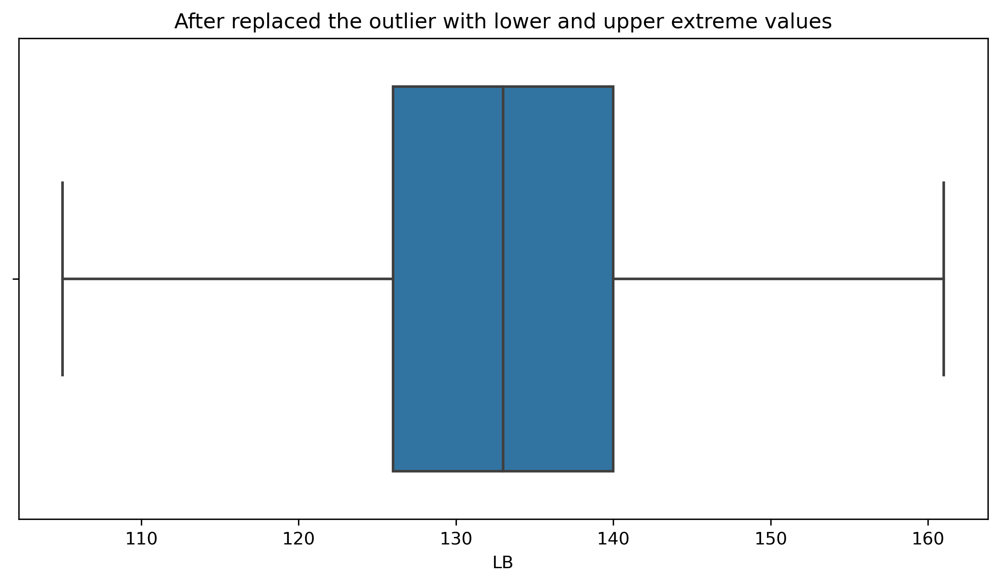

In [58]:
sns.boxplot(x = df["LB"])
plt.xlabel("LB")
plt.title("After replaced the outlier with lower and upper extreme values")

In [59]:
outlier_detection(df, "AC")

(-0.008418102, 0.01403017)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

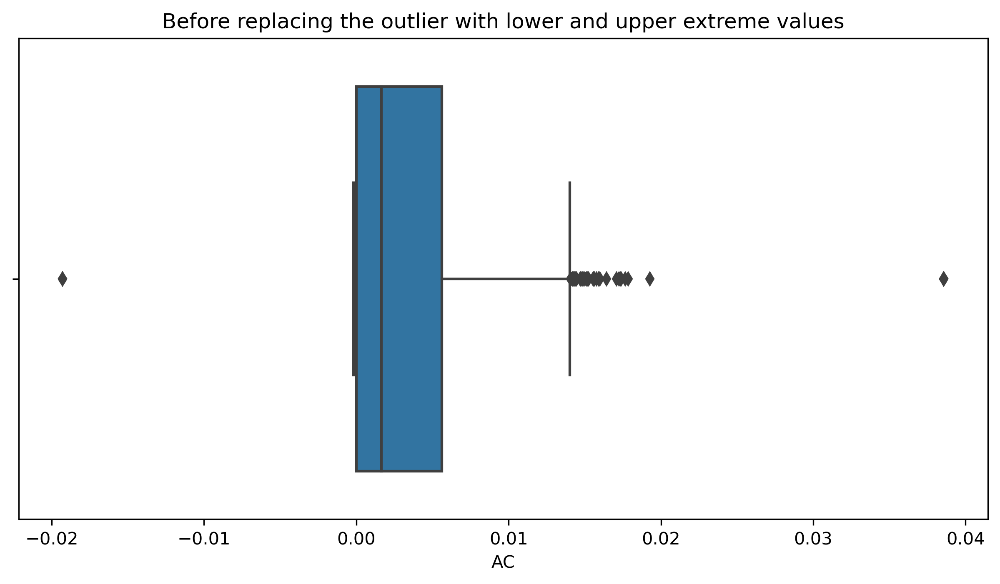

In [60]:
sns.boxplot(x = df["AC"])
plt.xlabel("AC")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [61]:
df.loc[df["AC"]>0.01403017, "AC"] = 0.01403017

In [62]:
df.loc[df["AC"]<-0.008418102, "AC"] = -0.008418102

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

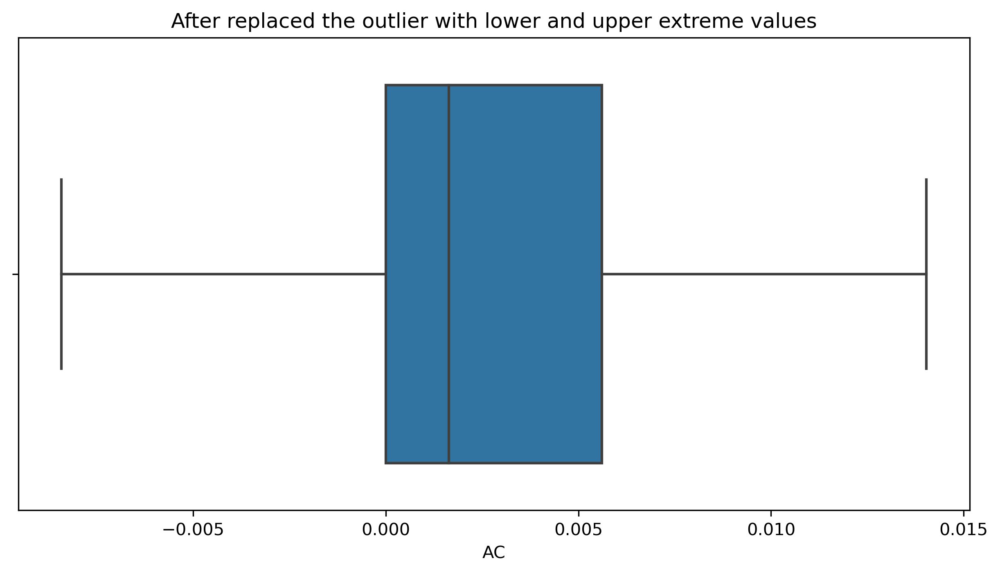

In [63]:
sns.boxplot(x = df["AC"])
plt.xlabel("AC")
plt.title("After replaced the outlier with lower and upper extreme values")

In [64]:
outlier_detection(df, "FM")

(-0.003852632625, 0.0064210543750000005)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

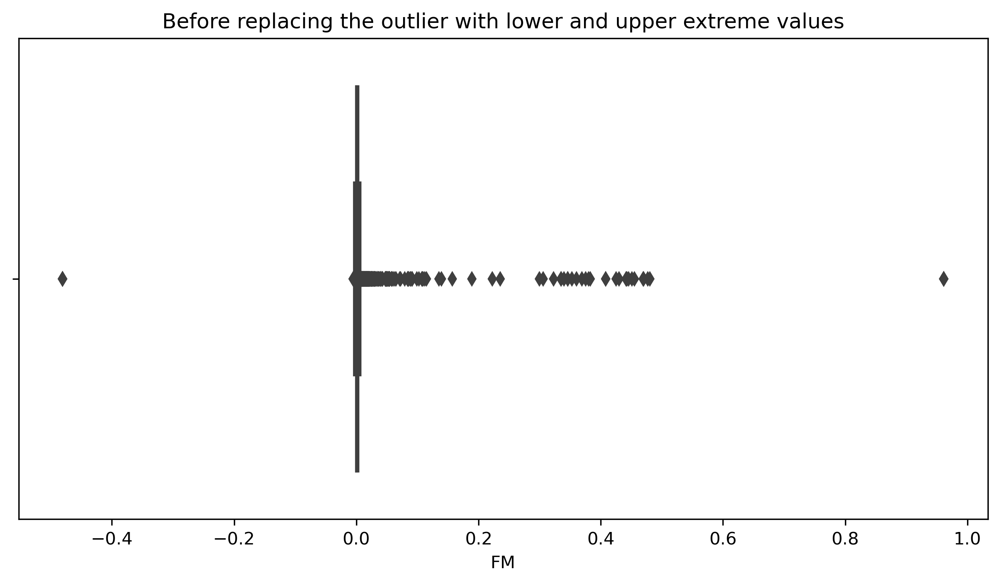

In [65]:
sns.boxplot(x = df["FM"])
plt.xlabel("FM")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [66]:
df.loc[df["FM"]>0.0064210543750000005, "FM"] = 0.0064210543750000005

In [67]:
df.loc[df["FM"]<-0.003852632625, "FM"] = -0.003852632625

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

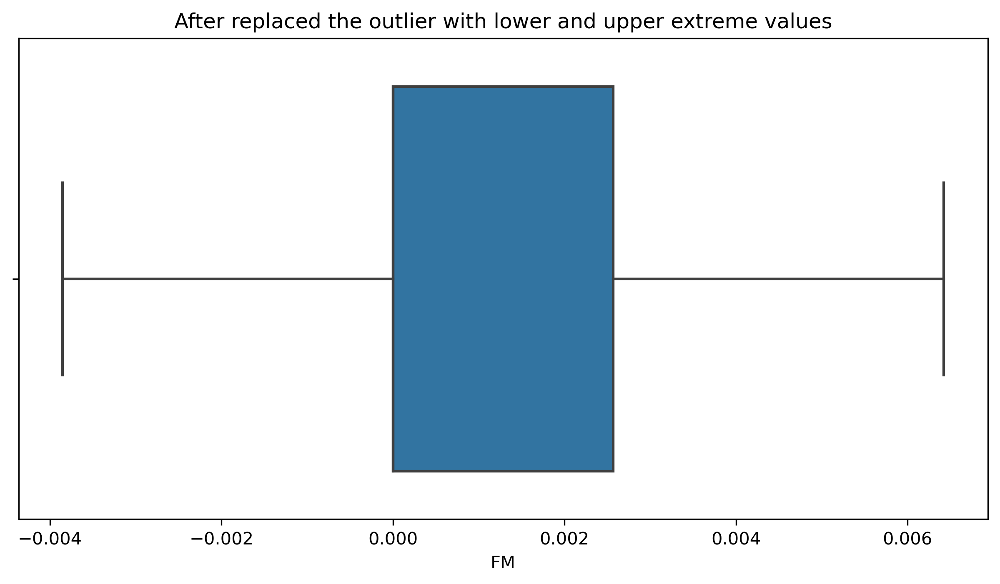

In [68]:
sns.boxplot(x = df["FM"])
plt.xlabel("FM")
plt.title("After replaced the outlier with lower and upper extreme values")

In [69]:
outlier_detection(df, "UC")

(-0.005158101374999999, 0.013552377624999999)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

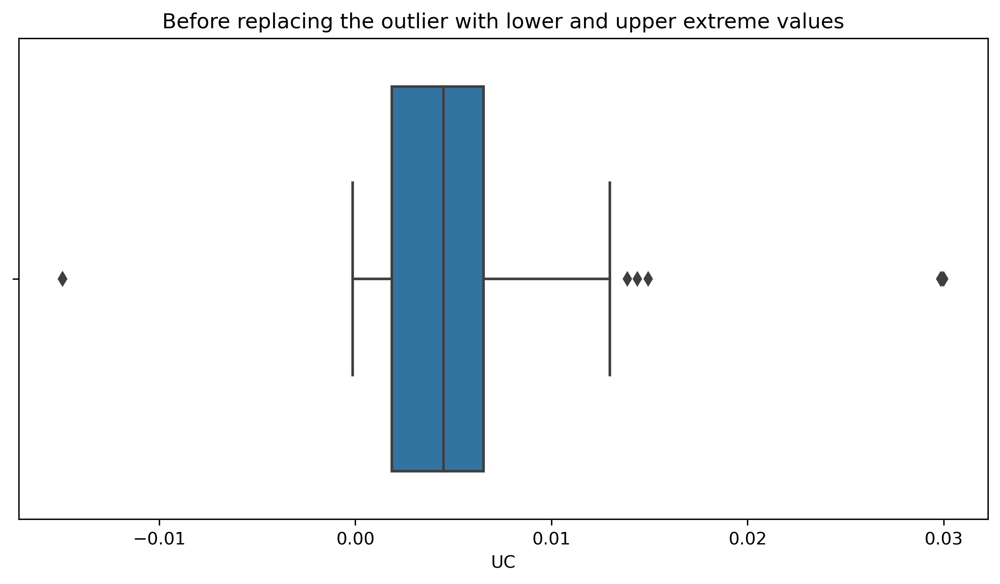

In [70]:
sns.boxplot(x = df["UC"])
plt.xlabel("UC")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [71]:
df.loc[df["UC"]>0.013552377624999999, "UC"] = 0.013552377624999999

In [72]:
df.loc[df["UC"]<-0.005158101374999999, "UC"] = -0.005158101374999999

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

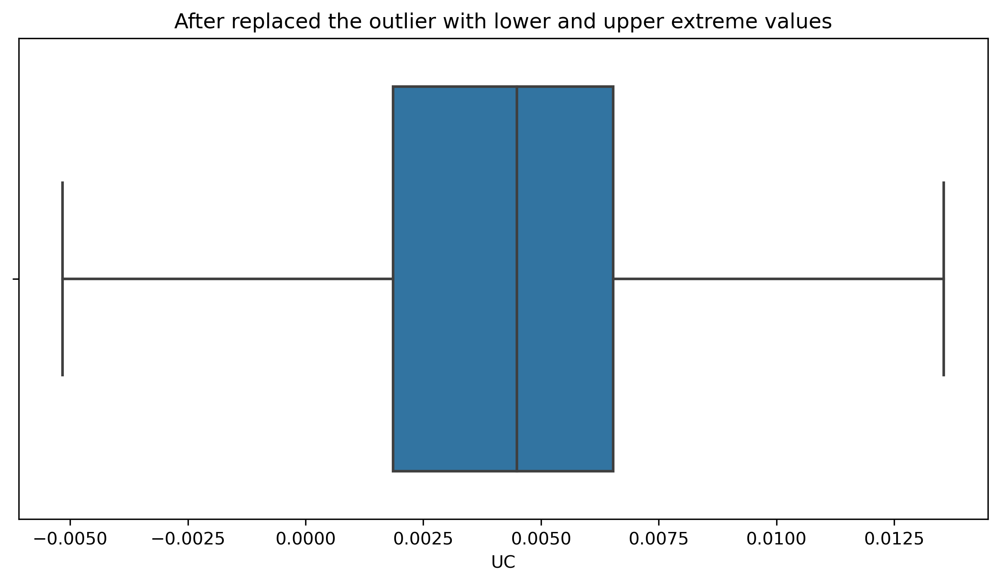

In [73]:
sns.boxplot(x = df["UC"])
plt.xlabel("UC")
plt.title("After replaced the outlier with lower and upper extreme values")

In [74]:
outlier_detection(df, "DL")

(-0.0049382820000000004, 0.00823047)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

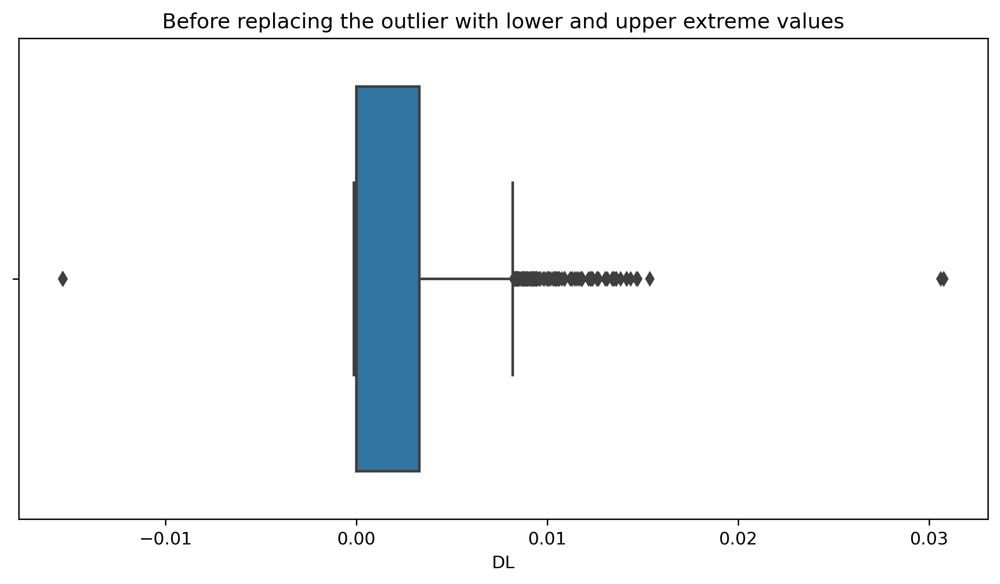

In [75]:
sns.boxplot(x = df["DL"])
plt.xlabel("DL")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [76]:
df.loc[df["DL"]>0.00823047, "DL"] = 0.00823047

In [77]:
df.loc[df["DL"]<-0.0049382820000000004, "DL"] = -0.0049382820000000004

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

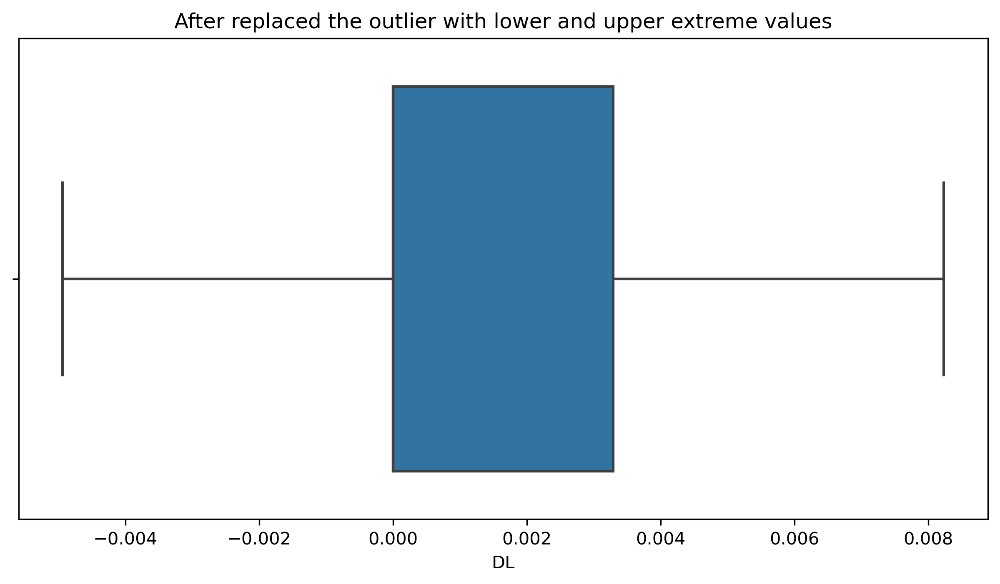

In [78]:
sns.boxplot(x = df["DL"])
plt.xlabel("DL")
plt.title("After replaced the outlier with lower and upper extreme values")

In [79]:
outlier_detection(df, "DS")

(0.0, 0.0)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

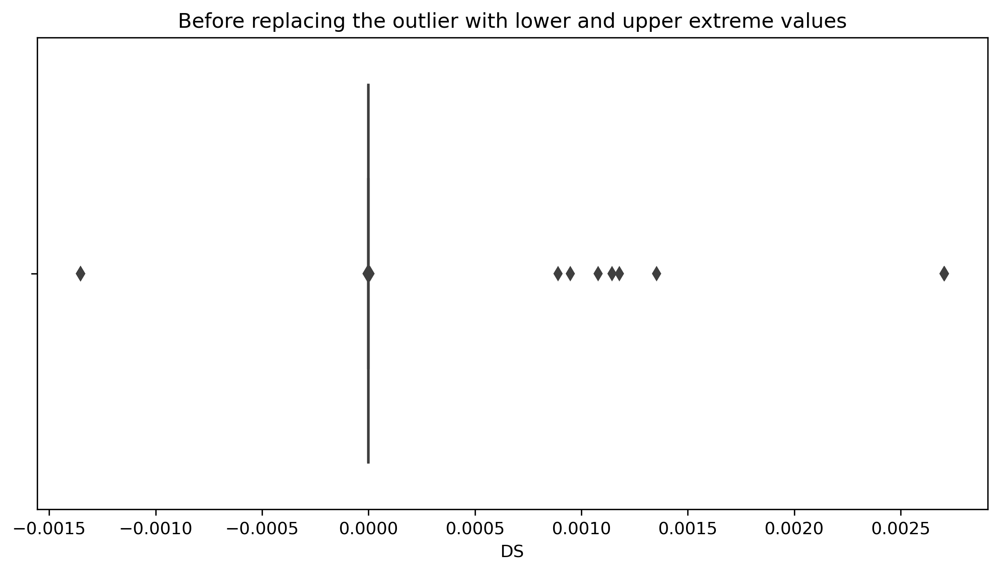

In [80]:
sns.boxplot(x = df["DS"])
plt.xlabel("DS")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [81]:
df.loc[df["DS"]>0.0, "DS"] = 0.0

In [82]:
df.loc[df["DS"]<0.0, "DS"] = 0.0

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

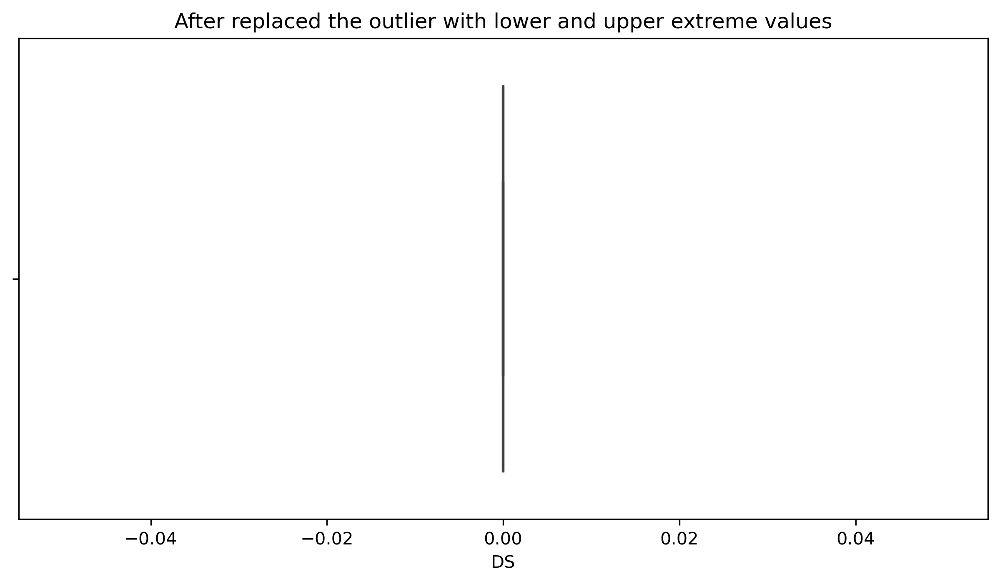

In [83]:
sns.boxplot(x = df["DS"])
plt.xlabel("DS")
plt.title("After replaced the outlier with lower and upper extreme values")

In [84]:
outlier_detection(df, "ASTV")

(-11.5, 104.5)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

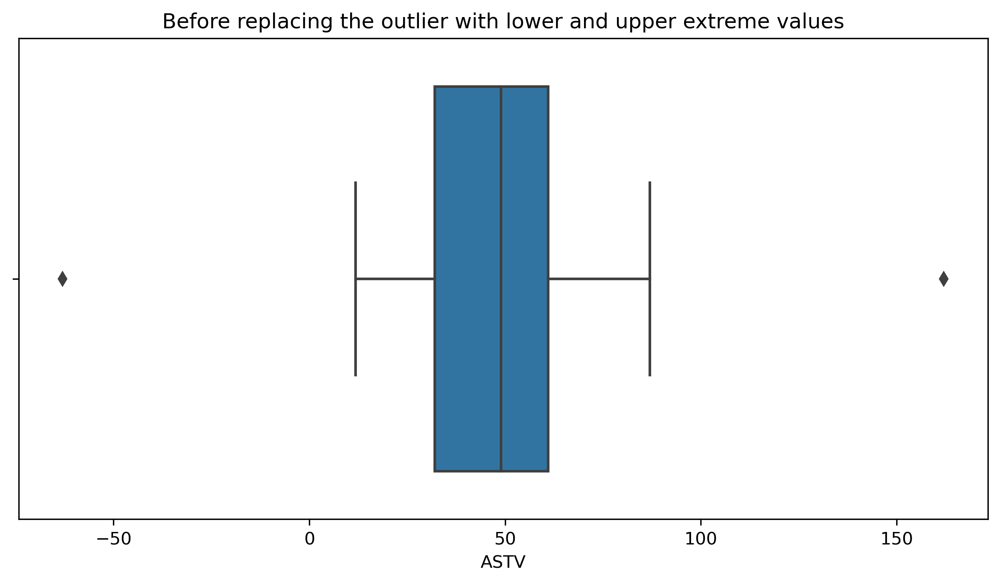

In [85]:
sns.boxplot(x = df["ASTV"])
plt.xlabel("ASTV")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [86]:
df.loc[df["ASTV"]>104.5, "ASTV"] = 104.5

In [87]:
df.loc[df["ASTV"]<-11.5, "ASTV"] = -11.5

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

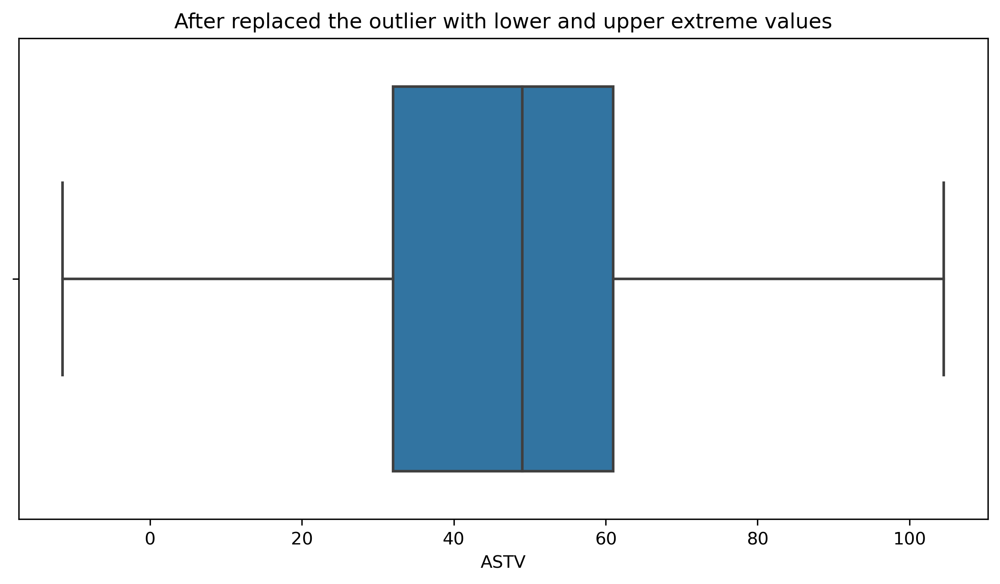

In [88]:
sns.boxplot(x = df["ASTV"])
plt.xlabel("ASTV")
plt.title("After replaced the outlier with lower and upper extreme values")

In [89]:
outlier_detection(df, "MSTV")

(-0.8, 3.2)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

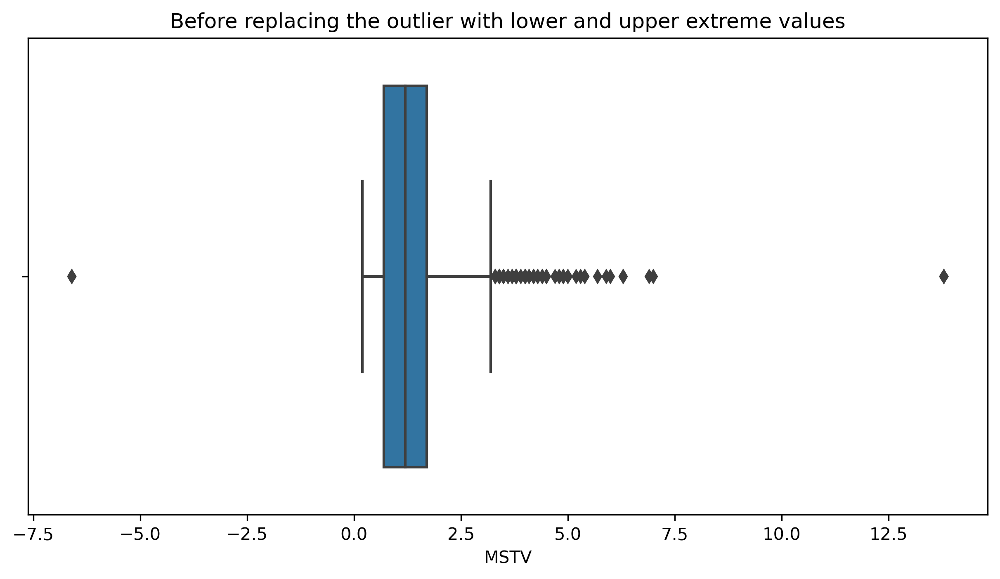

In [90]:
sns.boxplot(x = df["MSTV"])
plt.xlabel("MSTV")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [91]:
df.loc[df["MSTV"]>3.2, "MSTV"] = 3.2

In [92]:
df.loc[df["MSTV"]<-0.8,"MSTV"] = -0.8

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

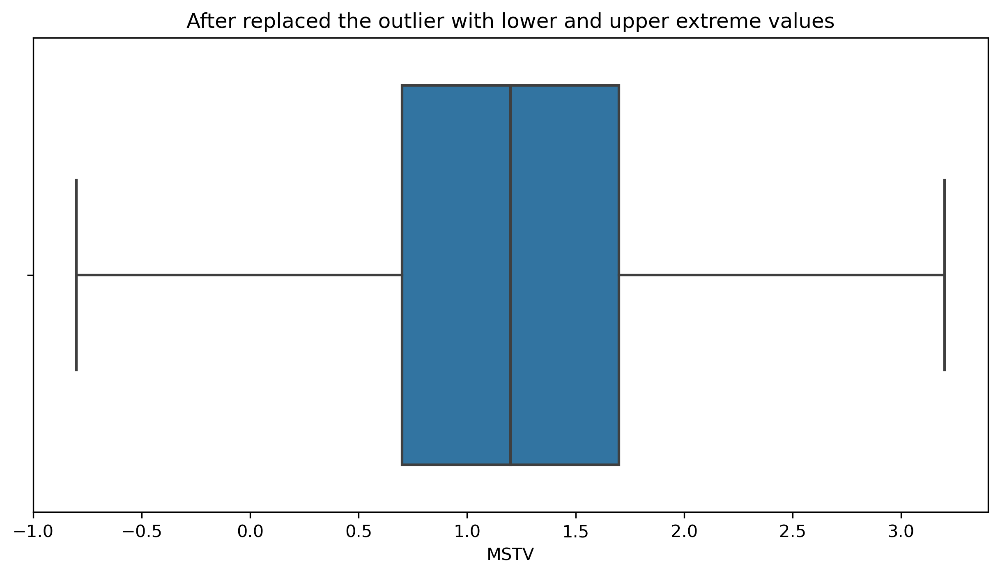

In [93]:
sns.boxplot(x = df["MSTV"])
plt.xlabel("MSTV")
plt.title("After replaced the outlier with lower and upper extreme values")

In [94]:
outlier_detection(df, "ALTV")

(-16.5, 27.5)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

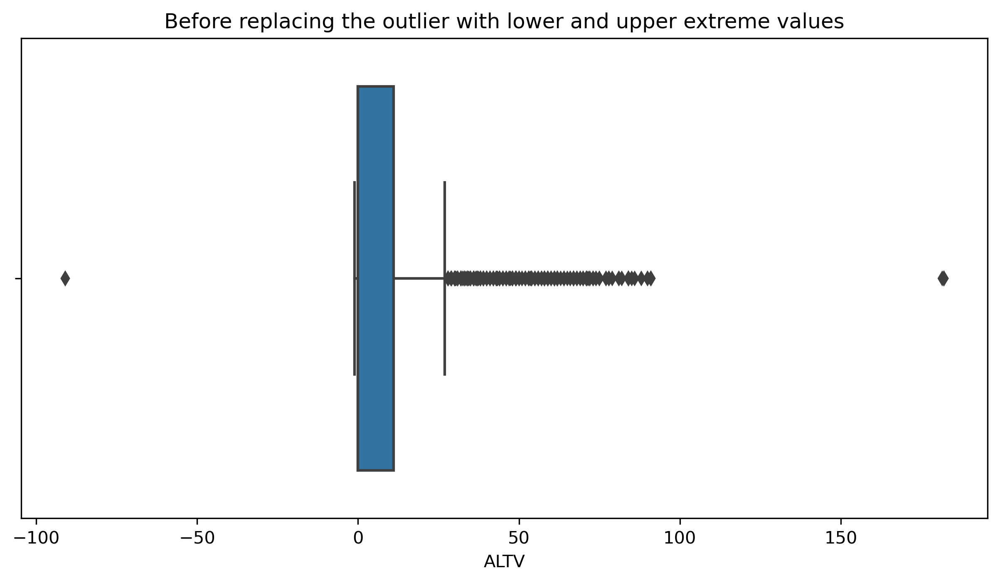

In [95]:
sns.boxplot(x = df["ALTV"])
plt.xlabel("ALTV")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [96]:
df.loc[df["ALTV"]>27.5, "ALTV"] = 27.5

In [97]:
df.loc[df["ALTV"]<-16.5, "ALTV"] = -16.5

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

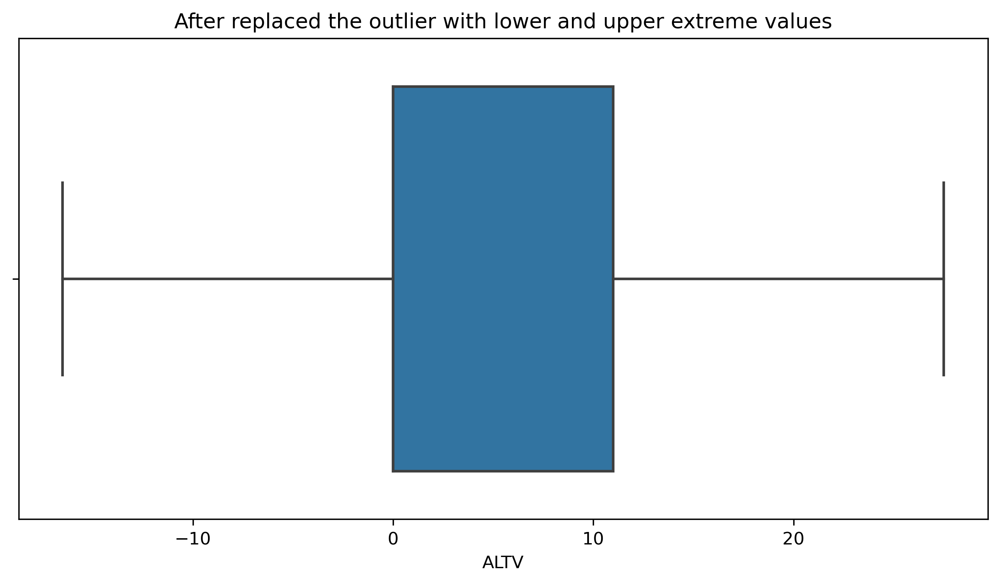

In [98]:
sns.boxplot(x = df["ALTV"])
plt.xlabel("ALTV")
plt.title("After replaced the outlier with lower and upper extreme values")

In [99]:
outlier_detection(df, "MLTV")

(-4.700000000000001, 20.1)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

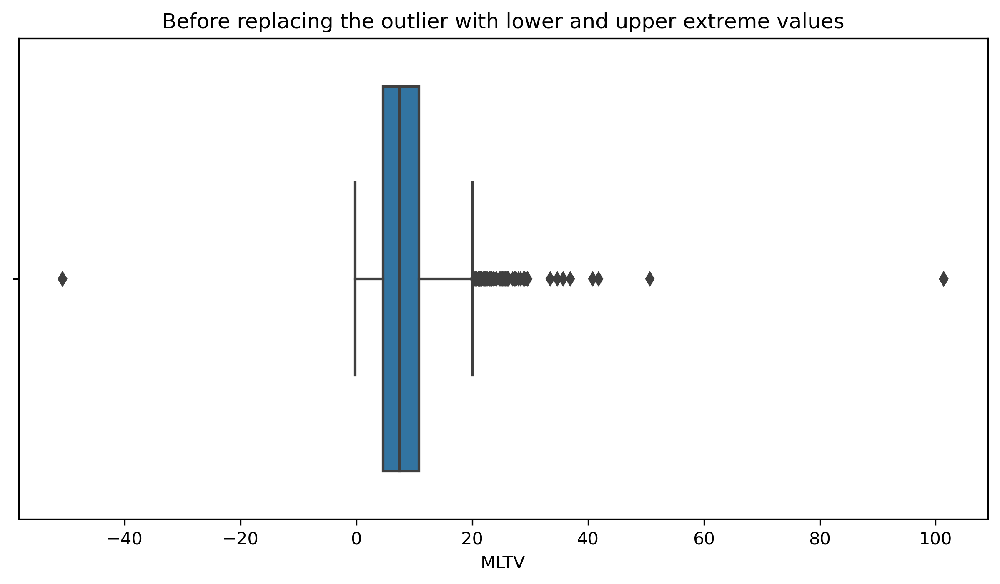

In [100]:
sns.boxplot(x = df["MLTV"])
plt.xlabel("MLTV")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [101]:
df.loc[df["MLTV"]>20.1, "MLTV"] = 20.1

In [102]:
df.loc[df["MLTV"]<-4.700000000000001, "MLTV"] = -4.700000000000001

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

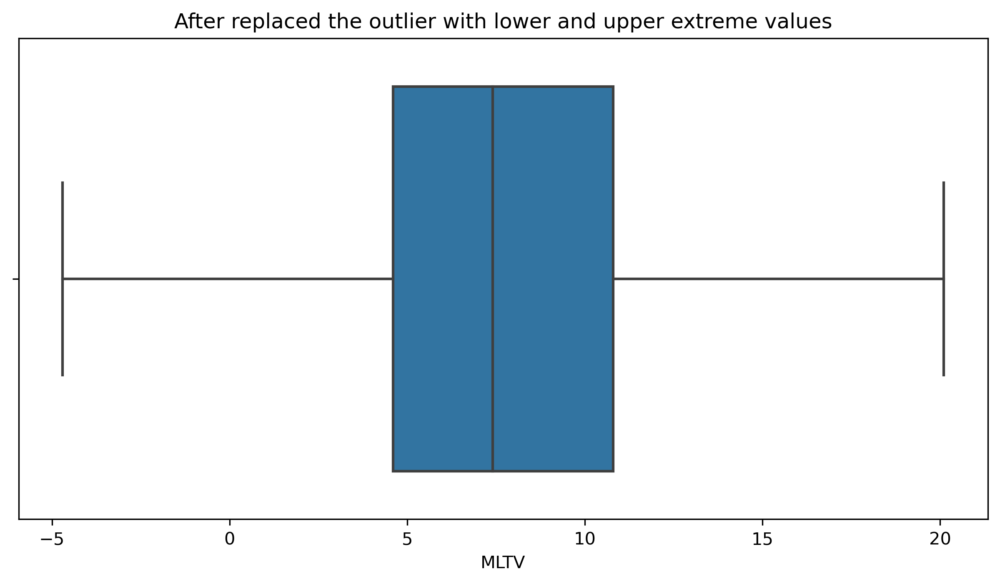

In [103]:
sns.boxplot(x = df["MLTV"])
plt.xlabel("MLTV")
plt.title("After replaced the outlier with lower and upper extreme values")

In [104]:
outlier_detection(df, "Width")

(-57.5, 194.5)

Text(0.5, 1.0, 'Before replaced the outlier with lower and upper extreme values')

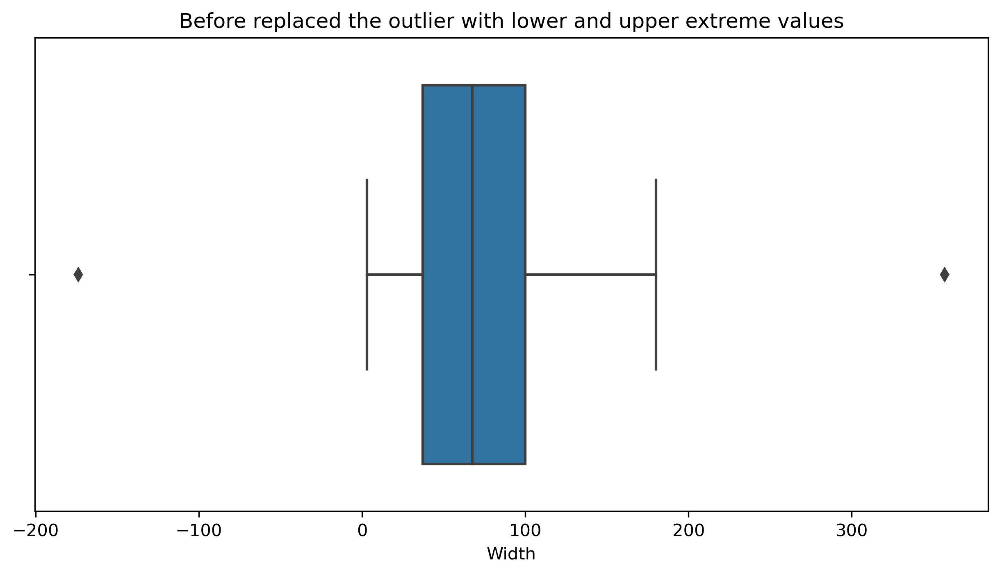

In [105]:
sns.boxplot(x = df["Width"])
plt.xlabel("Width")
plt.title("Before replaced the outlier with lower and upper extreme values")

In [106]:
df.loc[df["Width"]>194.5, "Width"] = 194.5

In [107]:
df.loc[df["Width"]<-57.5, "Width"] = -57.5

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

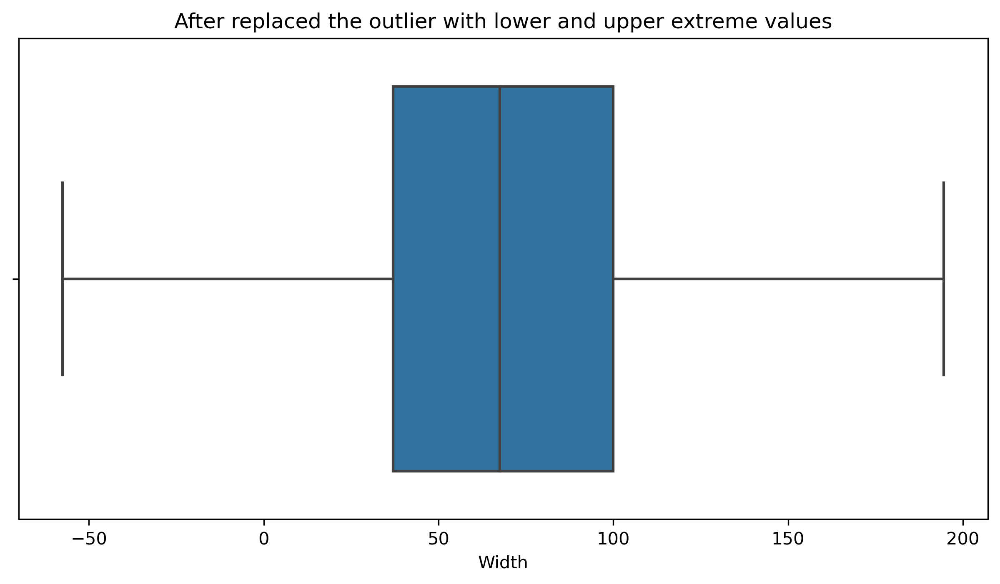

In [108]:
sns.boxplot(x = df["Width"])
plt.xlabel("Width")
plt.title("After replaced the outlier with lower and upper extreme values")

In [109]:
outlier_detection(df, "Tendency")

(-1.5, 2.5)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

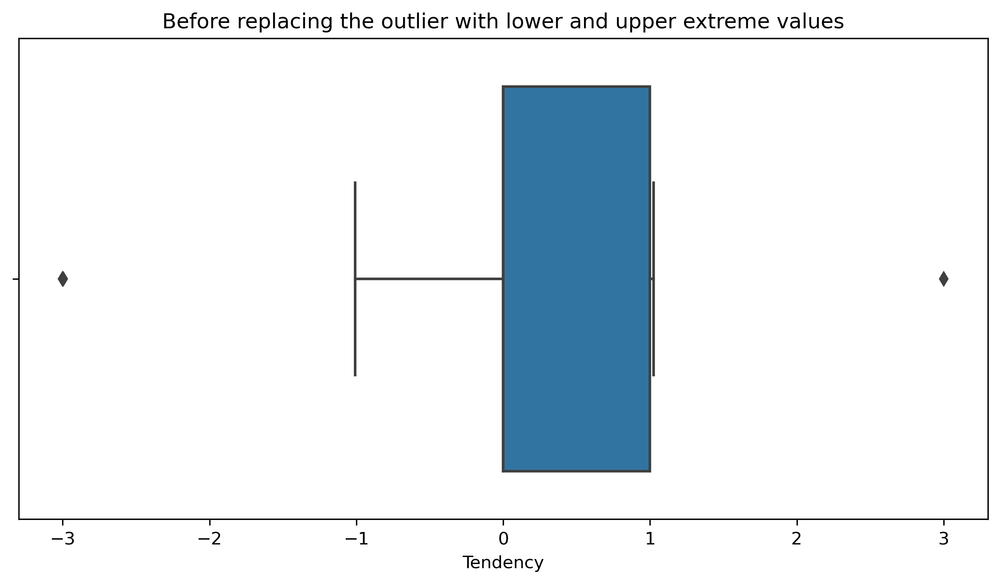

In [110]:
sns.boxplot(x = df["Tendency"])
plt.xlabel("Tendency")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [111]:
df.loc[df["Tendency"]>2.5, "Tendency"] = 2.5

In [112]:
df.loc[df["Tendency"]<-1.5, "Tendency"] = -1.5

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

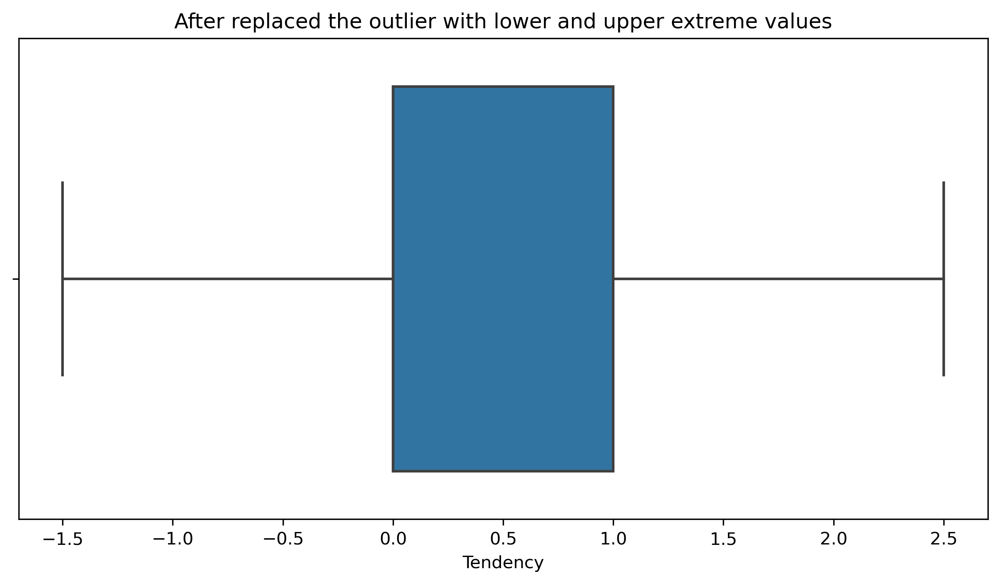

In [113]:
sns.boxplot(x = df["Tendency"])
plt.xlabel("Tendency")
plt.title("After replaced the outlier with lower and upper extreme values")

In [114]:
outlier_detection(df, "NSP")

(1.0, 1.0)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

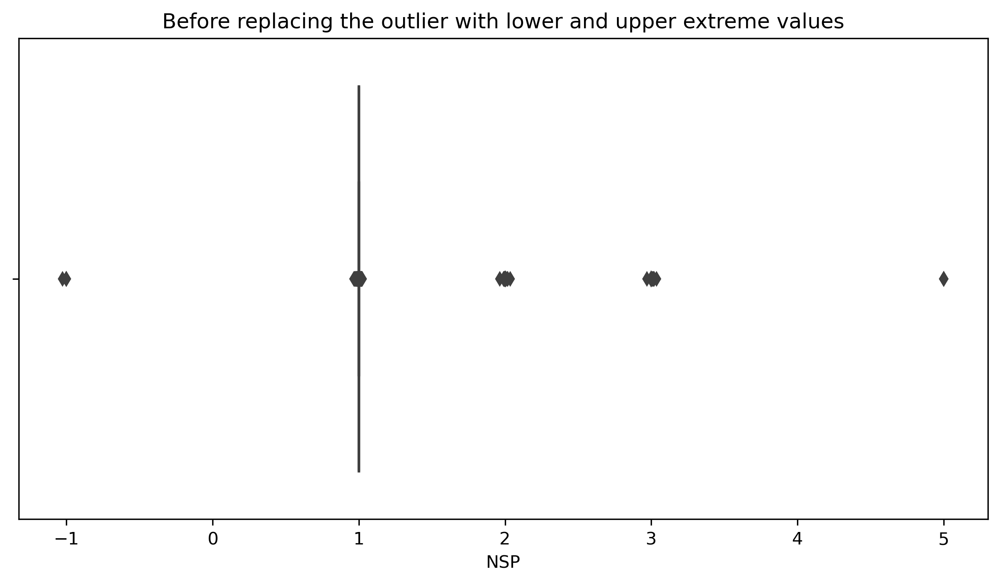

In [115]:
sns.boxplot(x = df["NSP"])
plt.xlabel("NSP")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [116]:
df.loc[df["NSP"]>1.0, "NSP"] = 1.0

In [117]:
df.loc[df["NSP"]<1.0, "NSP"] = 1.0

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

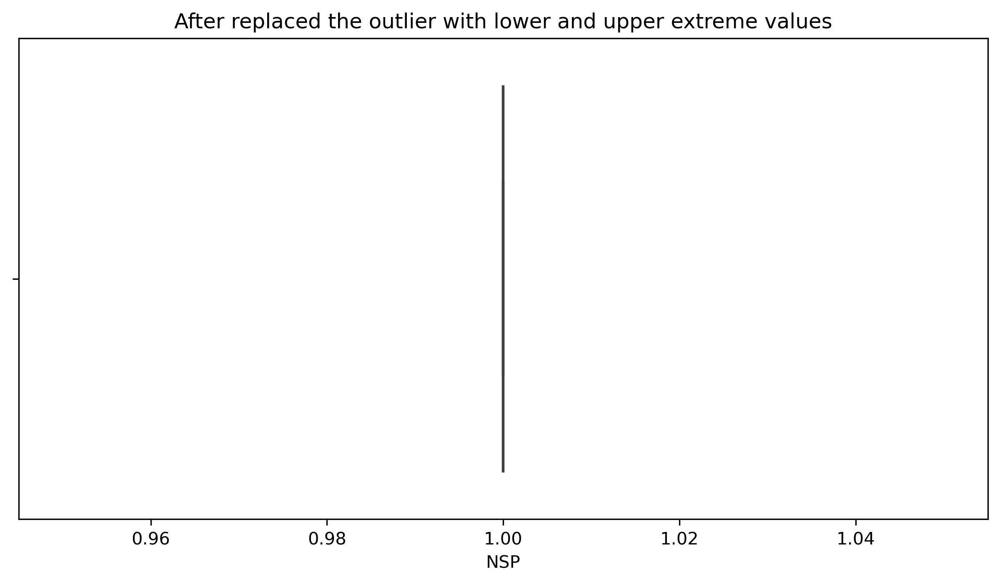

In [118]:
sns.boxplot(x = df["NSP"])
plt.xlabel("NSP")
plt.title("After replaced the outlier with lower and upper extreme values")

In [119]:
outlier_detection(df, "DP")

(0.0, 0.0)

Text(0.5, 1.0, 'Before replacing the outlier with lower and upper extreme values')

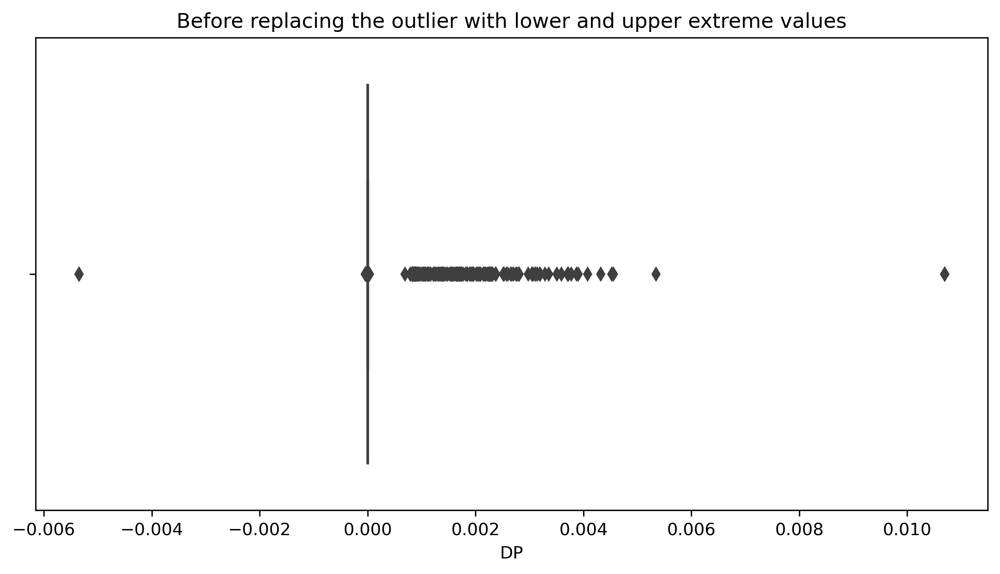

In [120]:
sns.boxplot(x = df["DP"])
plt.xlabel("DP")
plt.title("Before replacing the outlier with lower and upper extreme values")

In [121]:
df.loc[df["DP"]>0.0, "DP"] = 0.0

In [122]:
df.loc[df["DP"]<0.0, "DP"] = 0.0

Text(0.5, 1.0, 'After replaced the outlier with lower and upper extreme values')

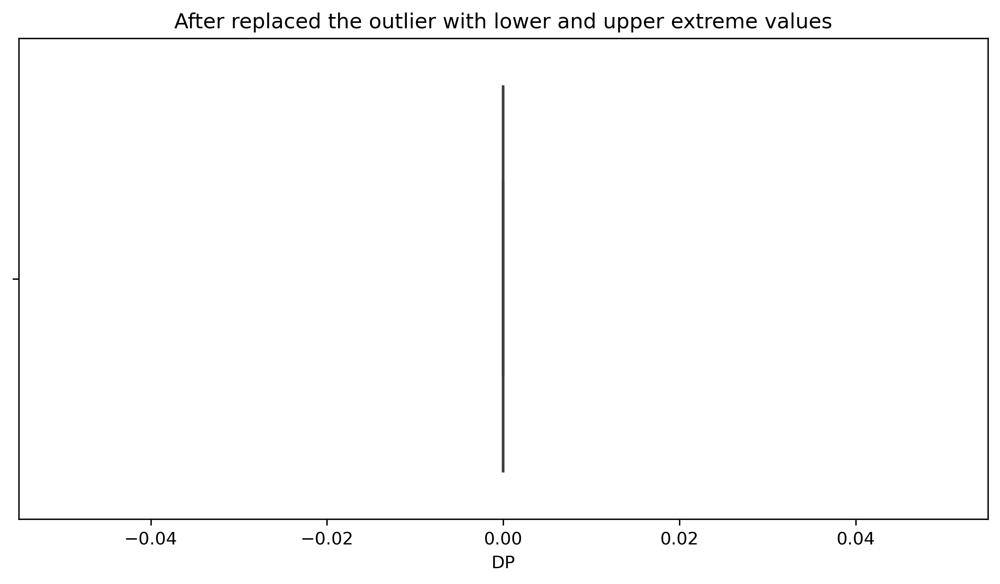

In [123]:
sns.boxplot(x = df["DP"])
plt.xlabel("DP")
plt.title("After replaced the outlier with lower and upper extreme values")

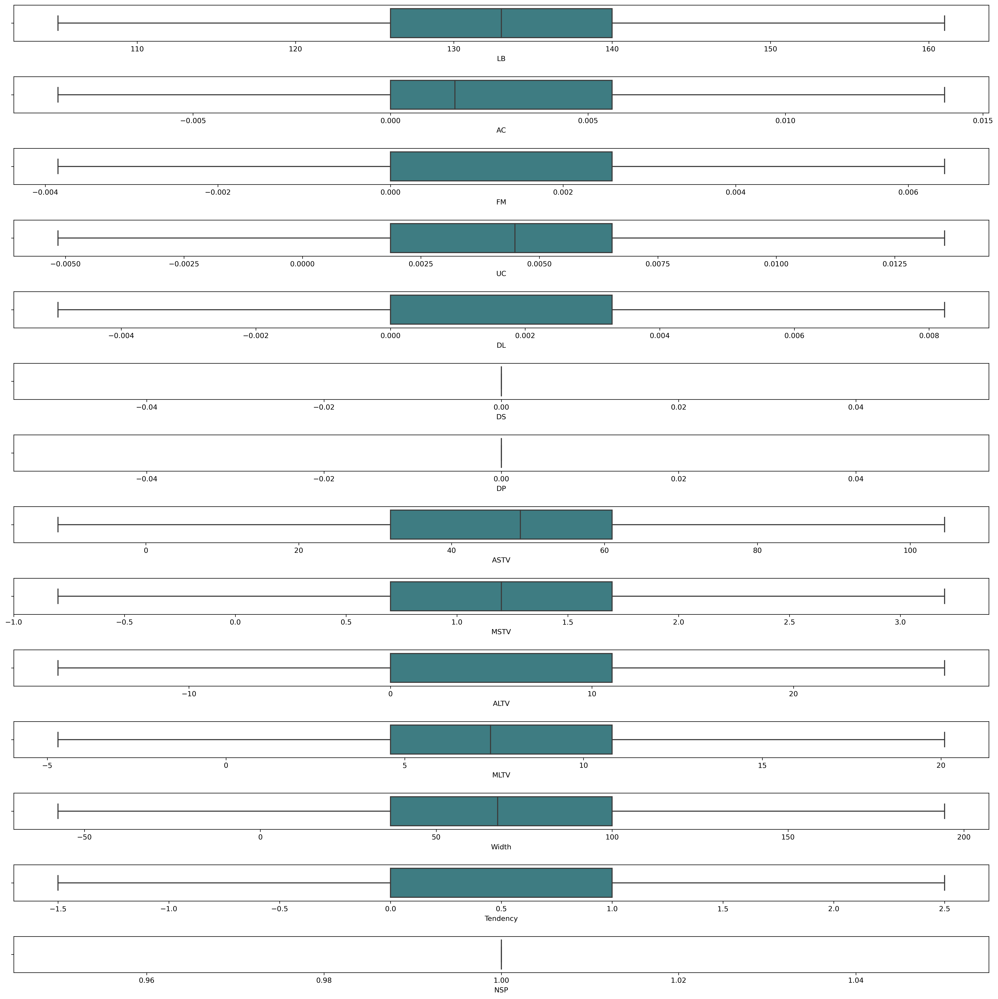

In [124]:
ot=df.copy() 
fig, axes=plt.subplots(14,1,figsize=(20,20),sharex=False,sharey=False)
sns.boxplot(x='LB',data=ot,palette='crest',ax=axes[0])
sns.boxplot(x='AC',data=ot,palette='crest',ax=axes[1])
sns.boxplot(x='FM',data=ot,palette='crest',ax=axes[2])
sns.boxplot(x='UC',data=ot,palette='crest',ax=axes[3])
sns.boxplot(x='DL',data=ot,palette='crest',ax=axes[4])
sns.boxplot(x='DS',data=ot,palette='crest',ax=axes[5])
sns.boxplot(x='DP',data=ot,palette='crest',ax=axes[6])
sns.boxplot(x='ASTV',data=ot,palette='crest',ax=axes[7])
sns.boxplot(x='MSTV',data=ot,palette='crest',ax=axes[8])
sns.boxplot(x='ALTV',data=ot,palette='crest',ax=axes[9])
sns.boxplot(x='MLTV',data=ot,palette='crest',ax=axes[10])
sns.boxplot(x='Width',data=ot,palette='crest',ax=axes[11])
sns.boxplot(x='Tendency',data=ot,palette='crest',ax=axes[12])
sns.boxplot(x='NSP',data=ot,palette='crest',ax=axes[13])
plt.tight_layout(pad=2.0)

# Drop columns

- There is one column which only has single different value.
- We need to get rid of all the uneccesary columns or else it will be very complex data.

In [126]:
df.head()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,73.0,0.5,27.5,2.4,64.0,0.999926,1.0
1,132.000000,0.006380,0.0,0.006380,0.003190,0.0,0.0,17.0,2.1,0.0,10.4,130.0,0.000000,1.0
2,133.000000,0.003322,0.0,0.008306,0.003322,0.0,0.0,16.0,2.1,0.0,13.4,130.0,0.000000,1.0
3,134.000000,0.002561,0.0,0.007742,0.002561,0.0,0.0,16.0,2.4,0.0,20.1,117.0,1.000000,1.0
4,131.948232,0.006515,0.0,0.008143,0.000000,0.0,0.0,16.0,2.4,0.0,19.9,117.0,1.000000,1.0


In [128]:
df.drop(columns = ["DS", "DP"], inplace = True)

In [129]:
df.head()

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.0,0.000000,0.000000,73.0,0.5,27.5,2.4,64.0,0.999926,1.0
1,132.000000,0.006380,0.0,0.006380,0.003190,17.0,2.1,0.0,10.4,130.0,0.000000,1.0
2,133.000000,0.003322,0.0,0.008306,0.003322,16.0,2.1,0.0,13.4,130.0,0.000000,1.0
3,134.000000,0.002561,0.0,0.007742,0.002561,16.0,2.4,0.0,20.1,117.0,1.000000,1.0
4,131.948232,0.006515,0.0,0.008143,0.000000,16.0,2.4,0.0,19.9,117.0,1.000000,1.0


# Scatter Plot and Correlation

In [130]:
sns.pairplot(df)

# Correlation coefficient

In [132]:
df.corr()

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
LB,1.000000,-0.081548,-0.006840,-0.163345,-0.156314,0.285464,-0.295132,0.322864,-0.042241,-0.139983,0.281144,NaN
AC,-0.081548,1.000000,0.075611,0.093222,-0.103258,-0.273189,0.216861,-0.408246,-0.151713,0.283724,0.030489,NaN
FM,-0.006840,0.075611,1.000000,-0.318156,-0.018024,0.155798,0.070412,-0.013820,-0.036439,0.164189,0.000302,NaN
UC,-0.163345,0.093222,-0.318156,1.000000,0.268151,-0.217484,0.298462,-0.294226,-0.073152,0.131025,-0.074729,NaN
DL,-0.156314,-0.103258,-0.018024,0.268151,1.000000,-0.112289,0.566625,-0.296383,-0.242345,0.514256,0.014025,NaN
ASTV,0.285464,-0.273189,0.155798,-0.217484,-0.112289,1.000000,-0.433731,0.438800,-0.323930,-0.242114,-0.010237,NaN
MSTV,-0.295132,0.216861,0.070412,0.298462,0.566625,-0.433731,1.000000,-0.541296,0.010734,0.646202,-0.064696,NaN
ALTV,0.322864,-0.408246,-0.013820,-0.294226,-0.296383,0.438800,-0.541296,1.000000,-0.132584,-0.439650,0.052204,NaN
MLTV,-0.042241,-0.151713,-0.036439,-0.073152,-0.242345,-0.323930,0.010734,-0.132584,1.000000,0.073585,0.142741,NaN
Width,-0.139983,0.283724,0.164189,0.131025,0.514256,-0.242114,0.646202,-0.439650,0.073585,1.000000,0.101228,NaN


<Axes: >

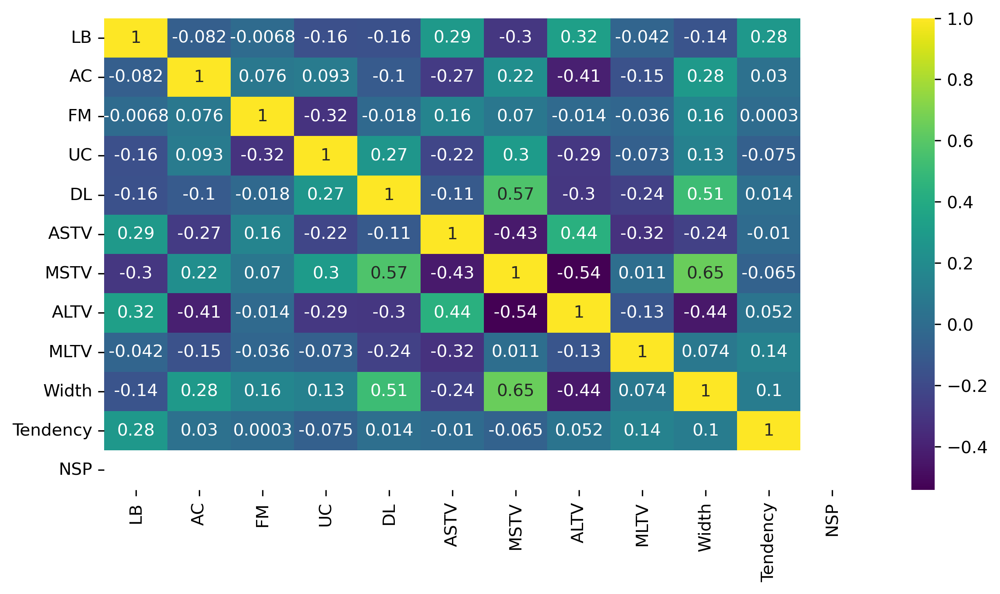

In [134]:
sns.heatmap(df.corr(), annot=True, cmap ="viridis")

# Transformations

- Machines do not understand words and sentences.
- Machines only understand numbers.
- Before model building, we have convert all the categorical columns into numerical.

# For this data set, we don't need to alter any columns because each column solely contains numerical values

# **Scaling the data**

- Normalization
    - Scales value within the range of 0 to 1.
- Standardization
    - Uses Z score for scaling.
    - Scale values in such a way that the mean = 0 and standard deviation is 1.

In [135]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# StandardScaler

In [136]:
sc = StandardScaler()

In [137]:
df.describe()

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.0
mean,133.288721,0.003133,0.001570,0.004365,0.001772,46.998334,1.304554,6.697979,8.002912,70.323356,0.316835,1.0
std,9.926790,0.003830,0.002487,0.003001,0.002670,17.609911,0.781303,10.381254,5.046792,39.577011,0.622623,0.0
min,105.000000,-0.008418,-0.003853,-0.005158,-0.004938,-11.500000,-0.800000,-16.500000,-4.700000,-57.500000,-1.500000,1.0
25%,126.000000,0.000000,0.000000,0.001858,0.000000,32.000000,0.700000,0.000000,4.600000,37.000000,0.000000,1.0
50%,133.000000,0.001634,0.000000,0.004486,0.000000,49.000000,1.200000,0.000000,7.400000,67.486468,0.000000,1.0
75%,140.000000,0.005612,0.002568,0.006536,0.003292,61.000000,1.700000,11.000000,10.800000,100.000000,1.000000,1.0
max,161.000000,0.014030,0.006421,0.013552,0.008230,104.500000,3.200000,27.500000,20.100000,194.500000,2.500000,1.0


In [138]:
df.head(2)

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.0,0.00000,0.0,0.00000,0.00000,73.0,0.5,27.5,2.4,64.0,0.999926,1.0
1,132.0,0.00638,0.0,0.00638,0.00319,17.0,2.1,0.0,10.4,130.0,0.000000,1.0


In [139]:
sc.fit_transform(df)

array([[-1.33898779, -0.81819929, -0.63145651, ..., -0.1598111 ,
         1.09737556,  0.        ],
       [-0.12985311,  0.84777075, -0.63145651, ...,  1.5082164 ,
        -0.50899136,  0.        ],
       [-0.02909189,  0.04937814, -0.63145651, ...,  1.5082164 ,
        -0.50899136,  0.        ],
       ...,
       [ 0.67623668, -0.56217892, -0.63145651, ..., -0.08399167,
         1.09749442,  0.        ],
       [ 0.67623668, -0.64091419, -0.63145651, ..., -0.10926481,
         1.09749442,  0.        ],
       [ 0.87775913, -0.39632395, -0.7068978 , ..., -0.71582027,
        -0.50899136,  0.        ]])

In [140]:
df.columns

Index(['LB', 'AC', 'FM', 'UC', 'DL', 'ASTV', 'MSTV', 'ALTV', 'MLTV', 'Width',
       'Tendency', 'NSP'],
      dtype='object')

In [141]:
scaled_data = pd.DataFrame(sc.fit_transform(df), columns = df.columns)

In [142]:
scaled_data

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,-1.338988,-0.818199,-0.631457,-1.455000,-0.663979,1.476884,-1.030002,2.004278,-1.110454,-0.159811,1.097376,0.0
1,-0.129853,0.847771,-0.631457,0.671673,0.530931,-1.703893,1.018341,-0.645351,0.475085,1.508216,-0.508991,0.0
2,-0.029092,0.049378,-0.631457,1.313738,0.580553,-1.760692,1.018341,-0.645351,1.069662,1.508216,-0.508991,0.0
3,0.071669,-0.149465,-0.631457,1.125802,0.295314,-1.760692,1.402405,-0.645351,2.397550,1.179666,1.097494,0.0
4,-0.135069,0.883044,-0.631457,1.259626,-0.663979,-1.760692,1.402405,-0.645351,2.357912,1.179666,1.097494,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2119,0.676237,-0.818199,1.951086,1.020416,-0.663979,1.817681,-1.414067,1.763403,-0.159131,-0.766367,-0.508991,0.0
2120,0.676237,-0.615921,-0.631457,0.871573,-0.663979,1.760881,-1.158024,1.474352,-0.178950,-0.109265,1.097494,0.0
2121,0.676237,-0.562179,-0.631457,0.832737,-0.663979,1.817681,-1.158024,1.281652,-0.377142,-0.083992,1.097494,0.0
2122,0.676237,-0.640914,-0.631457,0.581799,-0.663979,1.760881,-1.158024,1.956103,-0.198769,-0.109265,1.097494,0.0


In [143]:
scaled_data.describe()

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2.124000e+03,2.124000e+03,2.124000e+03,2.124000e+03,2.124000e+03,2.124000e+03,2.124000e+03,2124.000000,2.124000e+03,2.124000e+03,2.124000e+03,2124.0
mean,-1.445172e-15,2.007183e-17,2.676244e-17,2.140995e-16,-5.352488e-17,-5.352488e-17,6.690610e-17,0.000000,-1.338122e-16,1.706105e-16,-8.028731e-17,0.0
std,1.000235e+00,1.000235e+00,1.000235e+00,1.000235e+00,1.000235e+00,1.000235e+00,1.000235e+00,1.000235,1.000235e+00,1.000235e+00,1.000235e+00,0.0
min,-2.850406e+00,-3.016509e+00,-2.180982e+00,-3.174485e+00,-2.513879e+00,-3.322681e+00,-2.694281e+00,-2.235129,-2.517620e+00,-3.230498e+00,-2.918720e+00,0.0
25%,-7.344205e-01,-8.181993e-01,-6.314565e-01,-8.355152e-01,-6.639788e-01,-8.518990e-01,-7.739593e-01,-0.645351,-6.744310e-01,-8.421860e-01,-5.089914e-01,0.0
50%,-2.909189e-02,-3.914975e-01,-6.314565e-01,4.054093e-02,-6.639788e-01,1.136938e-01,-1.338521e-01,-0.645351,-1.194925e-01,-7.169709e-02,-5.089914e-01,0.0
75%,6.762367e-01,6.473407e-01,4.015604e-01,7.237977e-01,5.692881e-01,7.952887e-01,5.062551e-01,0.414500,5.543615e-01,7.500221e-01,1.097494e+00,0.0
max,2.792222e+00,2.845651e+00,1.951086e+00,3.062767e+00,2.419188e+00,3.266070e+00,2.426577e+00,2.004278,2.397550e+00,3.138334e+00,3.507223e+00,0.0


# We used the Z score approach to get all of the numbers into the same scale, and as you can see, the mean value is 0 and the standard division value is 1.

# MinMaxScalar

In [144]:
mn = MinMaxScaler()

In [146]:
minmax_scaled = pd.DataFrame(mn.fit_transform(df), columns = df.columns)

In [147]:
minmax_scaled

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,0.267857,0.375000,0.375000,0.275680,0.375000,0.728448,0.325,1.000000,0.286290,0.482143,0.624982,0.0
1,0.482143,0.659190,0.375000,0.616643,0.617224,0.245690,0.725,0.375000,0.608871,0.744048,0.375000,0.0
2,0.500000,0.522996,0.375000,0.719583,0.627284,0.237069,0.725,0.375000,0.729839,0.744048,0.375000,0.0
3,0.517857,0.489076,0.375000,0.689452,0.569462,0.237069,0.800,0.375000,1.000000,0.692460,0.625000,0.0
4,0.481218,0.665208,0.375000,0.710908,0.375000,0.237069,0.800,0.375000,0.991935,0.692460,0.625000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2119,0.625000,0.375000,1.000000,0.672556,0.375000,0.780172,0.250,0.943182,0.479839,0.386905,0.375000,0.0
2120,0.625000,0.409506,0.375000,0.648692,0.375000,0.771552,0.300,0.875000,0.475806,0.490079,0.625000,0.0
2121,0.625000,0.418673,0.375000,0.642466,0.375000,0.780172,0.300,0.829545,0.435484,0.494048,0.625000,0.0
2122,0.625000,0.405242,0.375000,0.602234,0.375000,0.771552,0.300,0.988636,0.471774,0.490079,0.625000,0.0


In [148]:
minmax_scaled.describe()

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.000000,2124.0
mean,0.505156,0.514573,0.527819,0.508956,0.509598,0.504296,0.526139,0.527227,0.512214,0.507236,0.454209,0.0
std,0.177264,0.170626,0.242067,0.160365,0.202761,0.151810,0.195326,0.235938,0.203500,0.157052,0.155656,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,0.375000,0.375000,0.375000,0.375000,0.375000,0.375000,0.375000,0.375000,0.375000,0.375000,0.375000,0.0
50%,0.500000,0.447789,0.375000,0.515455,0.375000,0.521552,0.500000,0.375000,0.487903,0.495978,0.375000,0.0
75%,0.625000,0.625000,0.625000,0.625000,0.625000,0.625000,0.625000,0.625000,0.625000,0.625000,0.625000,0.0
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0
